# REDES NEURAIS CONVOLUCIONAIS - EXEMPLO 2 (Orlando) - Gatos e Cachorros:

In [17]:
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report

In [3]:
classificador_gato_cachorro = Sequential()
classificador_gato_cachorro.add(InputLayer(shape=(128, 128, 3)))

# Primeira camada convolucional
classificador_gato_cachorro.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
classificador_gato_cachorro.add(BatchNormalization())
classificador_gato_cachorro.add(MaxPooling2D(pool_size=(2, 2)))

# Segunda camada convolucional
classificador_gato_cachorro.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
classificador_gato_cachorro.add(BatchNormalization())
classificador_gato_cachorro.add(MaxPooling2D(pool_size=(2, 2)))

# Terceira camada convolucional
classificador_gato_cachorro.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
classificador_gato_cachorro.add(BatchNormalization())
classificador_gato_cachorro.add(MaxPooling2D(pool_size=(2, 2)))

# Quarta camada convolucional
classificador_gato_cachorro.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
classificador_gato_cachorro.add(BatchNormalization())
classificador_gato_cachorro.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten + densa
classificador_gato_cachorro.add(Flatten())
classificador_gato_cachorro.add(Dense(256, activation='relu'))
classificador_gato_cachorro.add(Dropout(0.3))
classificador_gato_cachorro.add(Dense(128, activation='relu'))
classificador_gato_cachorro.add(Dropout(0.3))
classificador_gato_cachorro.add(Dense(1, activation='sigmoid'))

classificador_gato_cachorro.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 128)  │         3,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 128, 128, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 64, 64, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 16, 16, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,317,377 (12.65 MB)

 Trainable params: 3,315,841 (12.65 MB)

 Non-trainable params: 1,536 (6.00 KB)

In [4]:
classificador_gato_cachorro.compile(optimizer='adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

# Caminhos das pastas (ajustar conforme necessário)
caminho_treino = r"C:\Users\CLIENTE\Downloads\Deep Learning com Python de A a Z\Parte 2 - Redes Neurais Convolucionais\gatos cachorros\dataset\dataset\training_set"
caminho_teste = r"C:\Users\CLIENTE\Downloads\Deep Learning com Python de A a Z\Parte 2 - Redes Neurais Convolucionais\gatos cachorros\dataset\dataset\test_set"

# Geradores com imagens coloridas (3 canais)
gerador_treinamento = ImageDataGenerator(rescale=1./255, rotation_range=7,
                                         horizontal_flip=True, shear_range=0.2,
                                         height_shift_range=0.07, zoom_range=0.2)

gerador_teste = ImageDataGenerator(rescale=1./255)

# Bases de treino e teste
base_treinamento = gerador_treinamento.flow_from_directory(
    caminho_treino,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    color_mode='rgb'
)

base_teste = gerador_teste.flow_from_directory(
    caminho_teste,
    target_size=(128, 128),
    batch_size=32,
    class_mode='binary',
    color_mode='rgb',
    shuffle=False  # IMPORTANTÍSSIMO para manter ordem dos rótulos
)

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

historico_gato_cachorro = classificador_gato_cachorro.fit(base_treinamento, epochs = 30, validation_data = base_teste, callbacks=[early_stop])

Found 4000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Epoch 1/30


c:\Users\CLIENTE\anaconda3\envs\orlando\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


125/125 ━━━━━━━━━━━━━━━━━━━━ 119s 936ms/step - accuracy: 0.5421 - loss: 1.2059 - val_accuracy: 0.5000 - val_loss: 1.0861
Epoch 2/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 122s 975ms/step - accuracy: 0.5818 - loss: 0.7889 - val_accuracy: 0.4990 - val_loss: 0.6992
Epoch 3/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 127s 1s/step - accuracy: 0.6166 - loss: 0.6679 - val_accuracy: 0.5060 - val_loss: 0.8114
Epoch 4/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 135s 1s/step - accuracy: 0.6679 - loss: 0.6132 - val_accuracy: 0.6010 - val_loss: 0.6592
Epoch 5/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 122s 974ms/step - accuracy: 0.7112 - loss: 0.5606 - val_accuracy: 0.6700 - val_loss: 0.6076
Epoch 6/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - accuracy: 0.7103 - loss: 0.5539 - val_accuracy: 0.5910 - val_loss: 1.0464
Epoch 7/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 124s 989ms/step - accuracy: 0.7371 - loss: 0.5387 - val_accuracy: 0.6930 - val_loss: 0.5903
Epoch 8/30
125/125 ━━━━━━━━━━━━━━━━━━━━ 116s 931ms/step - accuracy: 0.7541 - loss: 0.5107 - val_

### Acurácia e Perda:

In [5]:
resultado = classificador_gato_cachorro.evaluate(base_teste)

print(f"Perda (loss): {resultado[0]:.4f}")
print(f"Acurácia (accuracy): {resultado[1] * 100:.2f}%")

32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 187ms/step - accuracy: 0.7676 - loss: 0.5519
Perda (loss): 0.3707
Acurácia (accuracy): 85.20%


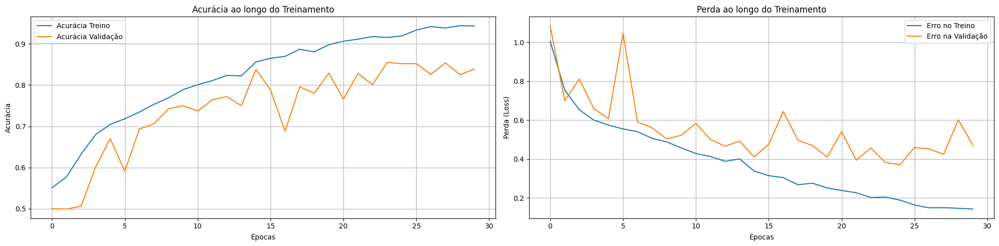

In [6]:
# Criar figura com 2 subplots lado a lado
fig, axs = plt.subplots(1, 2, figsize=(20, 5))

# --- Gráfico da Acurácia ---
axs[0].plot(historico_gato_cachorro.history['accuracy'], label='Acurácia Treino')
axs[0].plot(historico_gato_cachorro.history['val_accuracy'], label='Acurácia Validação')
axs[0].set_title('Acurácia ao longo do Treinamento')
axs[0].set_xlabel('Épocas')
axs[0].set_ylabel('Acurácia')
axs[0].legend()
axs[0].grid(True)

# --- Gráfico da Perda ---
axs[1].plot(historico_gato_cachorro.history['loss'], label='Erro no Treino')
axs[1].plot(historico_gato_cachorro.history['val_loss'], label='Erro na Validação')
axs[1].set_title('Perda ao longo do Treinamento')
axs[1].set_xlabel('Épocas')
axs[1].set_ylabel('Perda (Loss)')
axs[1].legend()
axs[1].grid(True)

# Ajustar o layout para não sobrepor
plt.tight_layout()
plt.show()

In [ ]:
# Previsões
num_amostras = base_teste.samples
batch_size = base_teste.batch_size
steps = int(np.ceil(num_amostras / batch_size))
y_prob = classificador_gato_cachorro.predict(base_teste, steps=steps)
y_pred = (y_prob > 0.5).astype(int).reshape(-1)
y_true = base_teste.classes

# Relatório
relatorio_dict = classification_report(y_true, y_pred, target_names=base_teste.class_indices.keys(), output_dict=True)
relatorio_df = pd.DataFrame(relatorio_dict).T

# Converter para %
for coluna in ['precision', 'recall', 'f1-score']:
    relatorio_df[coluna] *= 100

relatorio_df = relatorio_df.round(5)
relatorio_df = relatorio_df[['precision', 'recall', 'f1-score', 'support']]
relatorio_df.columns = ['Precisão (%)', 'Revocação (%)', 'F1-Score (%)', 'Suporte']

# Exibir bonito
espaco = 14
print("\n" + "Relatório de Classificação (em porcentagem):".center(espaco * 5))
print("-" * (espaco * 5))
print(f"{'Classe':<{espaco}}{'Precisão (%)':>{espaco}}{'Recall (%)':>{espaco}}{'F1-Score (%)':>{espaco}}{'Suporte':>{espaco}}")
print("-" * (espaco * 5))
for idx, row in relatorio_df.iterrows():
    print(f"{idx:<{espaco}}{row['Precisão (%)']:>{espaco}.5f}{row['Revocação (%)']:>{espaco}.5f}{row['F1-Score (%)']:>{espaco}.5f}{row['Suporte']:>{espaco}.0f}")
print("-" * (espaco * 5))

32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 183ms/step

             Relatório de Classificação (em porcentagem):             
----------------------------------------------------------------------
Classe          Precisão (%)    Recall (%)  F1-Score (%)       Suporte
----------------------------------------------------------------------
cachorro            93.78109      75.40000      83.59202           500
gato                79.43144      95.00000      86.52095           500
accuracy            85.20000      85.20000      85.20000             1
macro avg           86.60627      85.20000      85.05648          1000
weighted avg        86.60627      85.20000      85.05648          1000
----------------------------------------------------------------------


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


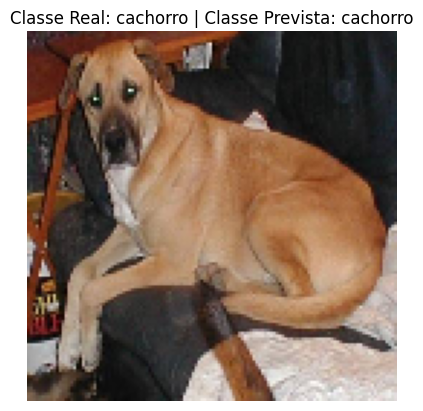


Probabilidade de ser 'gato' (classe 1): 8.04942%
Probabilidade de ser 'cachorro' (classe 0): 91.95058%

Tabela de Probabilidades Previstas:
  Classe  Probabilidade (%)
    gato            8.04942
cachorro           91.95058


In [18]:
testar_uma_imagem = True  # Ativa o teste individual

if testar_uma_imagem:
    # Gerar um lote da base de teste
    imagens, labels = next(base_teste)

    # Selecionar imagem aleatória dentro do lote
    indice = random.randint(0, imagens.shape[0] - 1)
    imagem = imagens[indice]
    label_real = int(labels[indice])

    # Preparar imagem para predição
    imagem_exp = np.expand_dims(imagem, axis=0)
    pred = classificador_gato_cachorro.predict(imagem_exp)

    # Corrigir a classe prevista com base na probabilidade (0 ou 1)
    classe_prevista = int(round(pred[0][0]))

    # Mapear índices para nomes de classes com base no dicionário do gerador
    classe_map = base_treinamento.class_indices  # Ex: {'cachorro': 0, 'gato': 1}
    indice_para_nome = {v: k for k, v in classe_map.items()}

    nome_classe_real = indice_para_nome[label_real]
    nome_classe_prevista = indice_para_nome[classe_prevista]

    # Exibir a imagem
    plt.imshow(imagem)
    plt.title(f"Classe Real: {nome_classe_real} | Classe Prevista: {nome_classe_prevista}")
    plt.axis('off')
    plt.show()

    # Calcular probabilidades em %
    prob_classe_0 = pred[0][0] * 100
    prob_classe_1 = 100 - prob_classe_0

    # Probabilidade de classe 1 (gato)
    prob_classe_1 = pred[0][0] * 100
    # Probabilidade de classe 0 (cachorro)
    prob_classe_0 = 100 - prob_classe_1

    # Exibir corretamente as probabilidades
    print(f"\nProbabilidade de ser '{indice_para_nome[1]}' (classe 1): {prob_classe_1:.5f}%")
    print(f"Probabilidade de ser '{indice_para_nome[0]}' (classe 0): {prob_classe_0:.5f}%")

    # Corrigir a tabela de probabilidades
    tabela_prob = pd.DataFrame({"Classe": [indice_para_nome[1], indice_para_nome[0]], "Probabilidade (%)": [prob_classe_1, prob_classe_0]})

    # Formatando a saída
    pd.options.display.float_format = '{:.5f}'.format
    print("\nTabela de Probabilidades Previstas:")
    print(tabela_prob.to_string(index=False))

32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 182ms/step


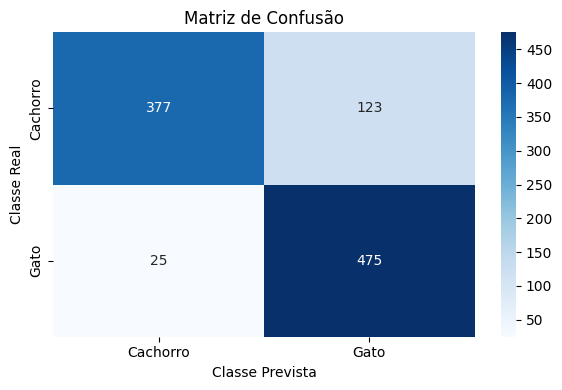

In [19]:
# Previsões do modelo para todos os dados da base de teste
y_probs = classificador_gato_cachorro.predict(base_teste)
y_pred = (y_probs > 0.5).astype("int").ravel()  # Converte para 0 ou 1
y_true = base_teste.classes  # Rótulos verdadeiros da base de teste

# Matriz de confusão
cm = confusion_matrix(y_true, y_pred)

# Mapeamento das classes
classe_map = base_treinamento.class_indices  # {'cachorro': 0, 'gato': 1}
indice_para_nome = {v: k.capitalize() for k, v in classe_map.items()}
rotulos = [indice_para_nome[0], indice_para_nome[1]]

# Plot da matriz
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=rotulos, yticklabels=rotulos)
plt.xlabel("Classe Prevista")
plt.ylabel("Classe Real")
plt.title("Matriz de Confusão")
plt.tight_layout()
plt.show()

32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 186ms/step


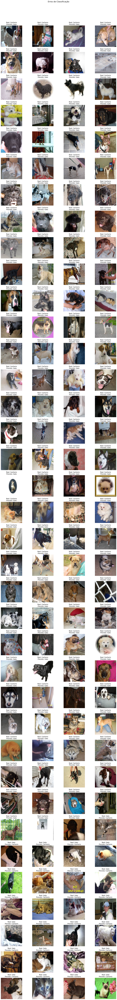

In [20]:
# Obter previsões completas
y_probs = classificador_gato_cachorro.predict(base_teste)
y_pred = (y_probs > 0.5).astype("int").ravel()
y_true = base_teste.classes

# Mapear classes
classe_map = base_treinamento.class_indices  # {'cachorro': 0, 'gato': 1}
indice_para_nome = {v: k.capitalize() for k, v in classe_map.items()}

# Obter imagens reais da base de teste
imagens_com_erro = []
rotulos_reais = []
rotulos_previstos = []

base_teste.reset()  # Reiniciar o gerador para garantir que imagens e classes estejam sincronizados
for i in range(len(base_teste)):
    img_batch, label_batch = base_teste[i]
    start = i * base_teste.batch_size
    end = start + img_batch.shape[0]
    for j in range(img_batch.shape[0]):
        idx = start + j
        if idx >= len(y_true):
            break
        if y_true[idx] != y_pred[idx]:
            imagens_com_erro.append(img_batch[j])
            rotulos_reais.append(y_true[idx])
            rotulos_previstos.append(y_pred[idx])

# Exibir imagens com erro em um grid (4 colunas)
num_erros = len(imagens_com_erro)
cols = 4
rows = int(np.ceil(num_erros / cols))

plt.figure(figsize=(15, rows * 3))
for i in range(num_erros):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(imagens_com_erro[i])
    real = indice_para_nome[rotulos_reais[i]]
    pred = indice_para_nome[rotulos_previstos[i]]
    plt.title(f"Real: {real}\nPrevisto: {pred}")
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Erros de Classificação", fontsize=16, y=1.02)
plt.savefig("C:/Users/CLIENTE/Downloads/erros_classificacao_grid.png", dpi=300, bbox_inches='tight')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


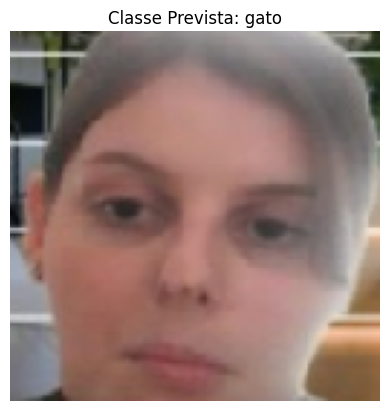


Probabilidade de ser 'gato' (classe 1): 78.66137%
Probabilidade de ser 'cachorro' (classe 0): 21.33863%

Tabela de Probabilidades Previstas:
  Classe  Probabilidade (%)
    gato           78.66137
cachorro           21.33863


In [24]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tensorflow.keras.preprocessing import image

# Caminho da imagem a ser testada
caminho_imagem = r"C:\Users\CLIENTE\Downloads\giovanna.jpg"

# Carregar e pré-processar a imagem
imagem_externa = image.load_img(caminho_imagem, target_size=(128, 128))  # Use o mesmo tamanho da rede
imagem_array = image.img_to_array(imagem_externa) / 255.0  # Normalização
imagem_exp = np.expand_dims(imagem_array, axis=0)  # Adiciona dimensão para batch

# Realizar a predição
pred = classificador_gato_cachorro.predict(imagem_exp)

# Interpretar a classe prevista (0 ou 1)
classe_prevista = int(round(pred[0][0]))

# Mapear índices para nomes de classes
classe_map = base_treinamento.class_indices  # Ex: {'cachorro': 0, 'gato': 1}
indice_para_nome = {v: k for k, v in classe_map.items()}
nome_classe_prevista = indice_para_nome[classe_prevista]

# Exibir a imagem
plt.imshow(imagem_array)
plt.title(f"Classe Prevista: {nome_classe_prevista}")
plt.axis('off')
plt.show()

# Calcular probabilidades
prob_classe_1 = pred[0][0] * 100
prob_classe_0 = 100 - prob_classe_1

# Mostrar as probabilidades
print(f"\nProbabilidade de ser '{indice_para_nome[1]}' (classe 1): {prob_classe_1:.5f}%")
print(f"Probabilidade de ser '{indice_para_nome[0]}' (classe 0): {prob_classe_0:.5f}%")

# Tabela de probabilidades
tabela_prob = pd.DataFrame({
    "Classe": [indice_para_nome[1], indice_para_nome[0]],
    "Probabilidade (%)": [prob_classe_1, prob_classe_0]
})

pd.options.display.float_format = '{:.5f}'.format
print("\nTabela de Probabilidades Previstas:")
print(tabela_prob.to_string(index=False))

### Extra - gerador de imagem

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import os

# Caminho para as imagens originais
pasta_gato = r"C:\Users\CLIENTE\Downloads\Deep Learning com Python de A a Z\Parte 2 - Redes Neurais Convolucionais\gatos cachorros\dataset\dataset\training_set\gato"

# Pasta onde as imagens geradas serão salvas
pasta_saida = r"C:\Users\CLIENTE\Downloads\gatos_gerados"

# Criar a pasta se não existir
os.makedirs(pasta_saida, exist_ok=True)

# Criar o gerador de imagens com aumento de dados
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest')

# Gerar imagens para cada imagem da pasta
for nome_arquivo in os.listdir(pasta_gato):
    caminho_imagem = os.path.join(pasta_gato, nome_arquivo)
    
    # Ignorar arquivos que não são imagem
    if not nome_arquivo.lower().endswith(('.png', '.jpg', '.jpeg')):
        continue
    
    # Carrega imagem, transforma em array e redimensiona
    imagem = load_img(caminho_imagem, target_size=(150, 150))  # ajuste o tamanho se necessário
    x = img_to_array(imagem)
    x = x.reshape((1,) + x.shape)
    
    # Gera imagens aumentadas e salva
    prefixo = os.path.splitext(nome_arquivo)[0]
    contador = 0
    for batch in datagen.flow(x, batch_size=1, save_to_dir=pasta_saida, save_prefix=prefixo, save_format='jpg'):
        contador += 1
        if contador >= 5:  # Número de imagens aumentadas por imagem original
            break